In [18]:
%load_ext autoreload
%autoreload 2
    
import pandas as pd
import cooler
import cooltools
from coolpuppy import coolpup
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib as mpl
import seaborn as sns
import numpy as np
import bioframe as bf
from IPython.display import Image
from pybedtools import BedTool as pbt
from joblib import Memory
from os import listdir
import re
from itertools import product
from pypdf import PdfMerger
import utils

# Add cache functionality to some functions
cachedir = 'cache'
memory = Memory(cachedir, verbose=0)

expected_cis_cache = memory.cache(cooltools.expected_cis, ignore=['nproc'])
subt_snips_cache = memory.cache(utils.subt_snips, ignore=['print_ct'])

# Matplotlib settings
mpl.rc('lines', linewidth=0.4)
mpl.rc('font', family='Helvetica', size=8)
mpl.rc('axes', labelsize=8, titlesize=8, linewidth=0.4)
mpl.rc('legend', fontsize=8)
mpl.rc('xtick', labelsize=6)
mpl.rc('xtick.major', width=0.4, size=2)
mpl.rc('xtick.minor', width=0.4, size=1)
mpl.rc('ytick', labelsize=6)
mpl.rc('ytick.major', width=0.4, size=2)
mpl.rc('ytick.minor', width=0.4, size=1)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Input data and parameters

In [2]:
# INPUT DATA

# Annotation of PcG contact anchors in adult neurons
hand_anch_path = "/tank/projects/polycomb/data/polycomb_dot_anchors.5kb.16_06_25.csv"

# PCA loadings for Tian2023
pca_loads_path = "/tank/projects/nvaulin_hic_sch/tian_polycomb_analysis/For_paper_Nov2024start/Polycomb_Loops_PCA_Loadings.csv"

# Coolers
clr_dir = '/tank/projects/tian2023/mcools_fixed/'
clr_path = {
    'EN': clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir_A24.EN.29_42_58_years.17356_cells.1kb.mcool",
    'IN': clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir_A24.IN.29_42_58_years.17356_cells.1kb.mcool",
    "L4-IT": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.L4-IT.29_42_58_years.2725_cells.20kb.mcool",
    "L5-IT": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.L5-IT.29_42_58_years.3366_cells.20kb.mcool",
    "L2-3-IT": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.L2-3-IT.29_42_58_years.13532_cells.20kb.mcool",
    "L6-IT": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.L6-IT.29_42_58_years.1749_cells.20kb.mcool",
    "L6-IT-Car3": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.L6-IT-Car3.29_42_58_years.1081_cells.20kb.mcool",
    "L5-6-NP": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.L5-6-NP.29_42_58_years.609_cells.20kb.mcool",
    "L6b": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.L6b.29_42_58_years.991_cells.20kb.mcool",
    "L6-CT": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.L6-CT.29_42_58_years.1271_cells.20kb.mcool",
    "Vip": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.Vip.29_42_58_years.4118_cells.20kb.mcool",
    "Sncg": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.Sncg.29_42_58_years.1654_cells.20kb.mcool",
    "Lamp5-Lhx6": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.Lamp5-Lhx6.29_42_58_years.843_cells.20kb.mcool",
    "Lamp5": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.Lamp5.29_42_58_years.1842_cells.20kb.mcool",
    "Sst": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.Sst.29_42_58_years.4299_cells.20kb.mcool",
    "Pvalb": clr_dir + "MTG_LEC_A46_FI_M1C_V1C_Pir.Pvalb.29_42_58_years.3181_cells.20kb.mcool",
}

In [3]:
# PARAMETERS

# Cooler matrix resolutions
clr_ress = [100_000]

# Prepare data for analysis

In [4]:
# Read coolers
samps = list(clr_path.keys()) # cell types
clrs = {res: {samp: cooler.Cooler(clr_path[samp] + f'::resolutions/{res}') 
        for samp in samps} for res in clr_ress}

In [5]:
# Get genomic view to use with cooltools and coolpuppy
hg38_chromsizes = bf.fetch_chromsizes('hg38')
hg38_chromsizes_view = pd.DataFrame(data={'chrom': hg38_chromsizes.index, 
                                          'start': 0*len(hg38_chromsizes),
                                          'end': hg38_chromsizes.values,
                                          'name': hg38_chromsizes.index})
# Drop chrX, chrY, chrM
hg38_chromsizes_view = hg38_chromsizes_view\
    .loc[~hg38_chromsizes_view['name'].isin(['chrX', 'chrY', 'chrM'])]

In [6]:
# Load PcG contact annotation from adult neurons
hand_anch = pd.read_csv(hand_anch_path)
hand_anch = bf.sort_bedframe(hand_anch, hg38_chromsizes_view)

# If no gene overlaps anchor, assign unique index
n_nan = sum(hand_anch['genes'].isna())
hand_anch.loc[hand_anch['genes'].isna(), 'genes'] = [f"locus_{i}" for i in range(n_nan)]

In [7]:
# Extract gene names at PcG anchors
hand_genes_all = hand_anch['genes'].dropna().str.split(',').values
hand_genes_all = [item for sublist in hand_genes_all for item in sublist]

# remove transcripts and ncRNAs
regex = re.compile(r'(^LINC|^RNA|^MIR|^A[LCP][0-9]+|.*\-AS|.*\-DT|.*\-OT)')
hand_pc = [i for i in hand_genes_all if not regex.match(i)]
hand_pc[:5]

['PAX7', 'RUNX3', 'RNF220', 'locus_0', 'TAL1']

# Analyze differential H3K27me3 regions (Kozlenkov2018)

# H3K27me3 pybbi for DE genes

## Make TPM values for Kozlenkov data

In [217]:
# koz_cnts.set_index("gene.id")\
#     .rename(columns={'GLU_mrg': "log2TPM_pl_1_GLU", 'SOX_mrg': "log2TPM_pl_1_GABA", 'OLIG_mrg': "log2TPM_pl_1_OLIG"})\
#     .loc[:, ['chrom', 'start', 'end', 'gene.name', 'gene.type', 'strand', 'log2TPM_pl_1_GLU', 'log2TPM_pl_1_GABA', 'log2TPM_pl_1_OLIG']]\
#     .to_csv("/tank/projects/schizophrenia_2021/data/kozlenkov2018/RNA-seq/kozlenkov.logTPM_counts.csv.gz")

## Work with DE genes

# Inhibitory vs excitatory neurons

In [42]:
# Select required coolers
res = 100_000
pl_clrs = {
    "EN": clrs[res]["EN"],
    "IN": clrs[res]['IN'],
}
pl_grps = list(pl_clrs.keys())

In [24]:
hand_anch['idx'] = hand_anch.index

In [25]:
pair_sites = bf.pair_by_distance(
    hand_anch, min_sep=10_000, max_sep=int(1e10), suffixes=('1', '2')
)
pair_sites.head()

,chrom1,start1,end1,genes1,idx1,chrom2,start2,end2,genes2,idx2
0,chr17,14300000,14320000,"HS3ST3B1,MGC12916,AC005224.2",237,chr17,35420000,35470000,"SLFN12,SLFN13,AC015911.4",238
1,chr17,14300000,14320000,"HS3ST3B1,MGC12916,AC005224.2",237,chr17,39595000,39635000,NEUROD2,239
2,chr17,35420000,35470000,"SLFN12,SLFN13,AC015911.4",238,chr17,39595000,39635000,NEUROD2,239
3,chr17,14300000,14320000,"HS3ST3B1,MGC12916,AC005224.2",237,chr17,48500000,48810000,"HOXB1,HOXB2,HOXB3,HOXB4,HOXB5,HOXB6,HOXB7,HOXB...",240
4,chr17,35420000,35470000,"SLFN12,SLFN13,AC015911.4",238,chr17,48500000,48810000,"HOXB1,HOXB2,HOXB3,HOXB4,HOXB5,HOXB6,HOXB7,HOXB...",240


In [26]:
# Expected
pl_cvd = {}
nproc = 20
for grp in pl_grps:
    print(grp)
    pl_cvd[grp] = expected_cis_cache(
        pl_clrs[grp],
        view_df=hg38_chromsizes_view,
        smooth=False,
        nproc=nproc
    )

EN
IN


## Plot: all dots as heatmap (with offset)

In [28]:
stack = {}
flank = 10 * res

for grp in pl_grps:
    stack[grp] = cooltools.pileup(
        pl_clrs[grp], 
        pair_sites, 
        view_df=hg38_chromsizes_view, 
        expected_df=pl_cvd[grp], 
        flank=flank
    )

In [29]:
# Extract row indices and pileup values for EN and IN
for grp in pl_grps:
    pair_sites[f'vals_{grp}'] = np.transpose(stack[grp], axes=[2, 0, 1]).tolist()

pairs_grp1 = pair_sites.loc[:, ['idx1', 'idx2', f'vals_{pl_grps[0]}']]\
                       .rename(columns={f'vals_{pl_grps[0]}': 'vals'})\
                       .copy(deep=True)
pairs_grp2 = pair_sites.loc[:, ['idx1', 'idx2', f'vals_{pl_grps[1]}']]\
                       .rename(columns={f'vals_{pl_grps[1]}': 'vals'})\
                       .copy(deep=True)
pairs_grp2[['idx1', 'idx2']] = pairs_grp2[['idx2', 'idx1']]
pairs_sum = pd.concat([pairs_grp1, pairs_grp2])

pairs_sum.head()

,idx1,idx2,vals
0,237,238,"[[1.7190674993333077, 1.213815881930579, 1.375..."
1,237,239,"[[nan, nan, nan, 0.27927522995800996, 0.400584..."
2,238,239,"[[nan, nan, nan, 0.29521095836551503, 0.415980..."
3,237,240,"[[0.6018192482165526, 0.7865856944335091, 0.69..."
4,238,240,"[[0.9171703269233454, 1.4018059133951448, 1.05..."


In [32]:
# Create all pairs of indices
idx = np.arange(len(hand_anch))
idx_pair = [idxs for idxs in product(idx, idx)]
idx_pair_df = pd.DataFrame(data=idx_pair, columns=['idx1', 'idx2'])
idx_pair_df.head()

,idx1,idx2
0,0,0
1,0,1
2,0,2
3,0,3
4,0,4


In [33]:
# Merge all pairs with pileup values
plot_df = idx_pair_df.merge(pairs_sum, on=['idx1', 'idx2'], how='left')\
                     .pivot(index='idx1', columns='idx2', values='vals')
plot_df.head()

idx2,0,1,2,3,4,5,6,7,8,9,...,252,253,254,255,256,257,258,259,260,261
idx1,,,,,,,,,,,,,,,,,,,,,
0,NaN,"[[0.9593942451780104, 1.1016202401848567, 1.30...","[[1.0254928607332394, 0.7745419252786025, 1.18...","[[1.0725378435232211, 1.1866725541270124, 1.41...","[[1.2744313832618748, 1.6842305776265263, 1.65...","[[1.656517376524043, 1.5219029489879699, 1.859...","[[1.627824588626081, 1.3994041921584313, 1.745...","[[0.8163817192945706, 0.8388541496770452, 0.69...","[[0.7801352302652113, 0.6586875296743243, 0.58...","[[0.3854176793915465, 0.4832721817431813, 0.72...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"[[1.0247722830082788, 1.3365268207242056, 1.24...",NaN,"[[0.9604047795908855, 0.8616590624969839, 1.08...","[[2.0595066631783427, 1.3204187166075898, 1.18...","[[1.9420223872532272, 1.1875785408234116, 1.37...","[[1.379463683783853, 1.7497132678150777, 1.154...","[[1.1784639599176003, 1.1155359468589894, 1.46...","[[0.6103818150003186, 0.7490176385193298, 0.60...","[[1.2776412998670879, 0.741001768047477, 0.901...","[[0.8249551177262764, 0.6542654411639806, 0.92...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"[[1.3478133112746207, 1.293792284542394, 1.274...","[[1.3590621332066442, 1.4762016230146042, 1.16...",NaN,"[[0.6351123918335349, 0.583031404955948, 0.520...","[[0.6251743867927284, 0.4738588100557012, 0.38...","[[0.3897109111524218, 0.40921326967717825, 0.3...","[[0.20493021390862615, 0.2088294646328868, 0.2...","[[0.183882558717319, 0.11155147726758374, 0.14...","[[0.29001754454534073, 0.09284072898287346, 0....","[[0.21792318466729485, 0.19560306270192415, 0....",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"[[0.9130905884119571, 1.1498013730203762, 0.98...","[[1.6974426216547018, 1.2798087994909808, 0.95...","[[0.7851164749183167, 0.6920030655573449, 0.56...",NaN,"[[0.8572624161021543, 0.5049029993130376, 0.32...","[[0.32470445286358296, 0.2848384952083911, 0.2...","[[0.2163613369354436, 0.17759256342601765, 0.2...","[[0.28832102680939176, 0.23307209267678083, 0....","[[0.8073495995133948, 0.6585378890752898, 0.77...","[[0.6263827192471532, 0.6460352802566061, 0.62...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"[[0.902989417153697, 1.3508128052851225, 1.828...","[[1.9641197741355714, 1.4025320705736435, 1.85...","[[0.7335347015140918, 0.5827246104516902, 0.59...","[[0.8836332818662209, 0.5060656004552717, 0.31...",NaN,"[[0.48666731401184316, 0.5169835164862495, 0.4...","[[0.3091412595580683, 0.20881445199081258, 0.2...","[[0.3335647186248055, 0.35582693466177695, 0.3...","[[0.6815357345641608, 1.06498367156693, 0.7247...","[[0.39164444306960755, 0.7130536186603473, 0.6...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


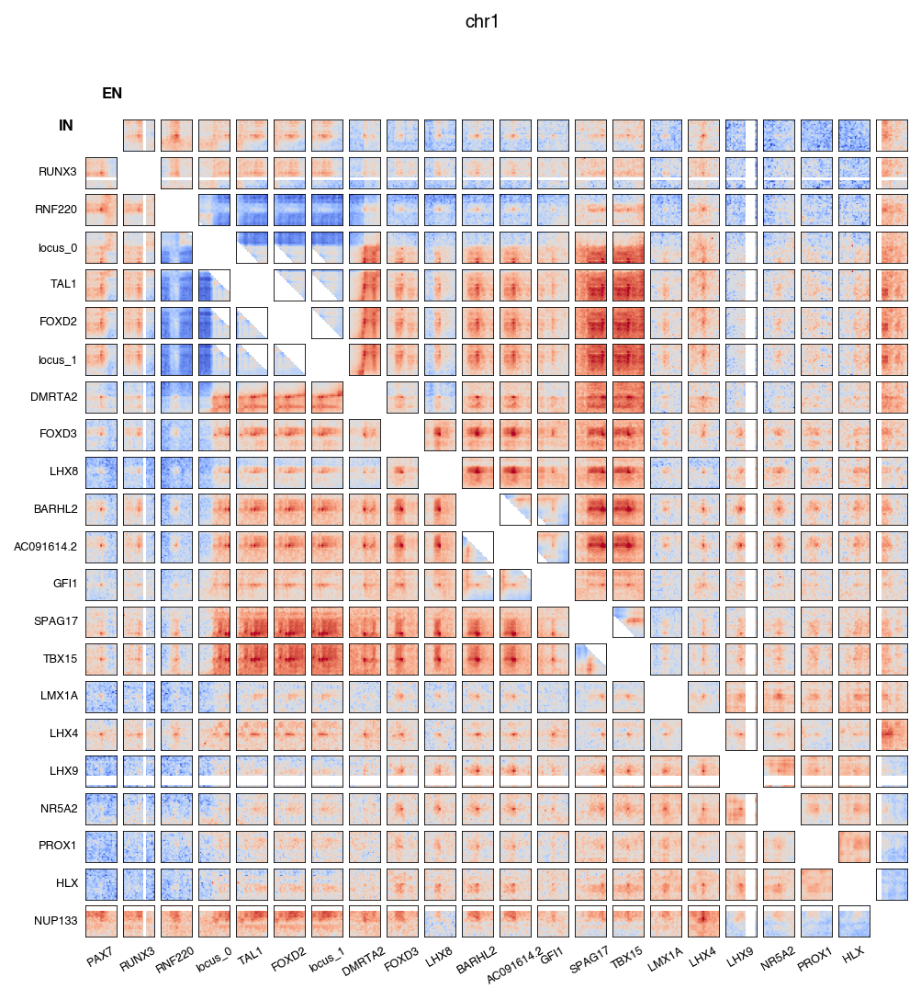

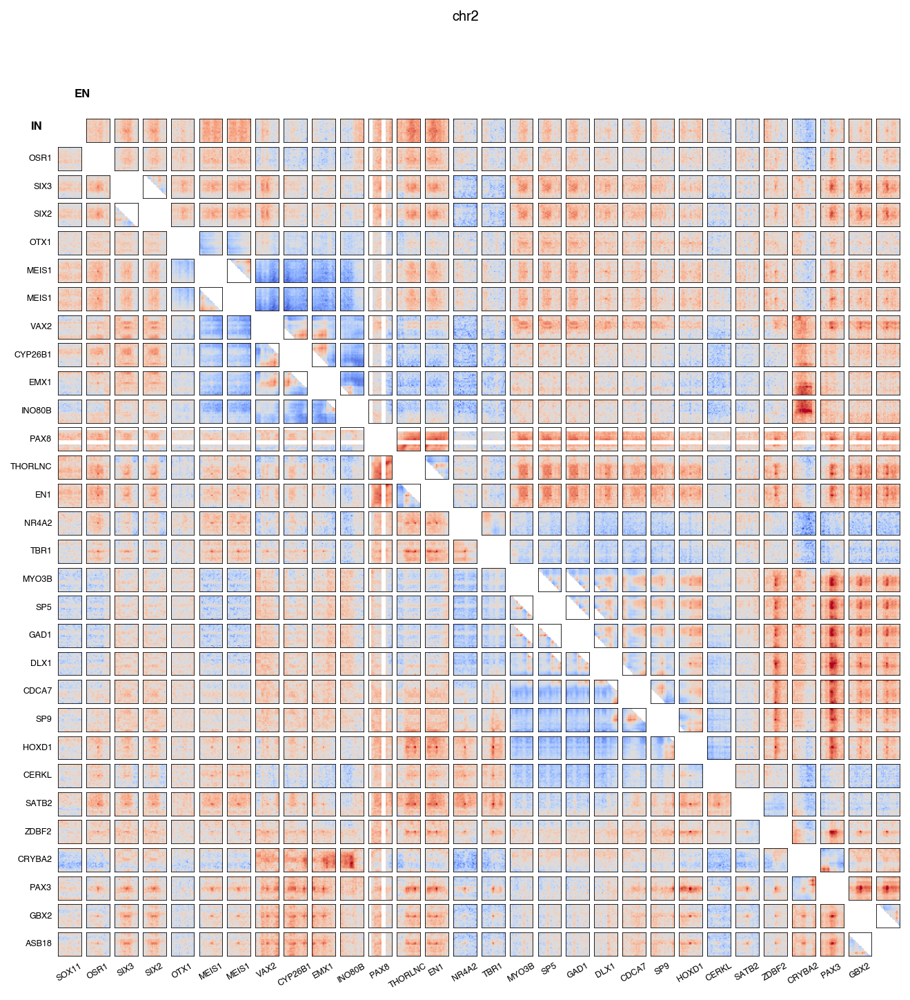

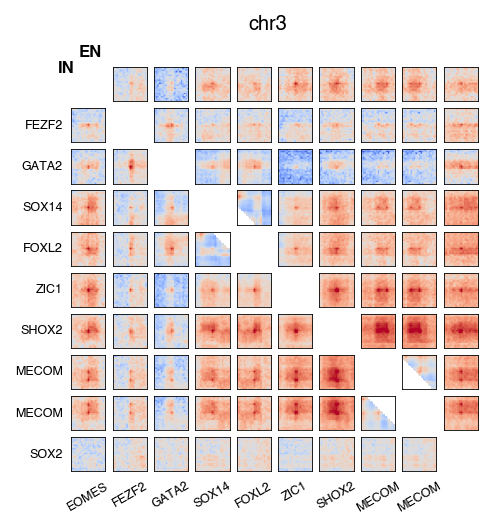

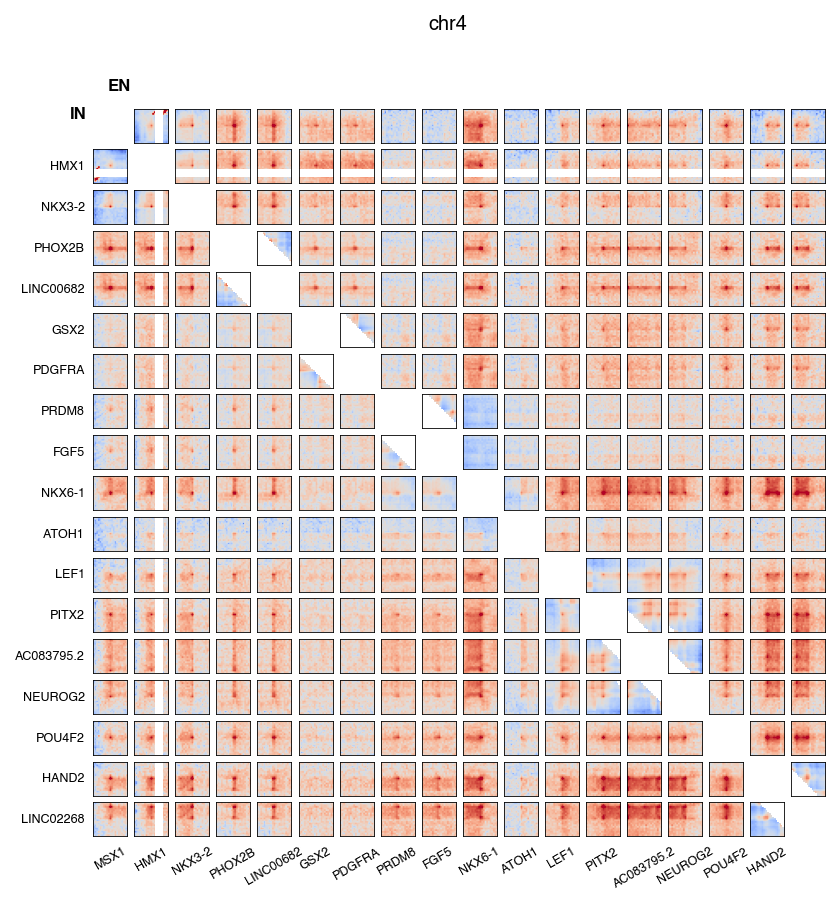

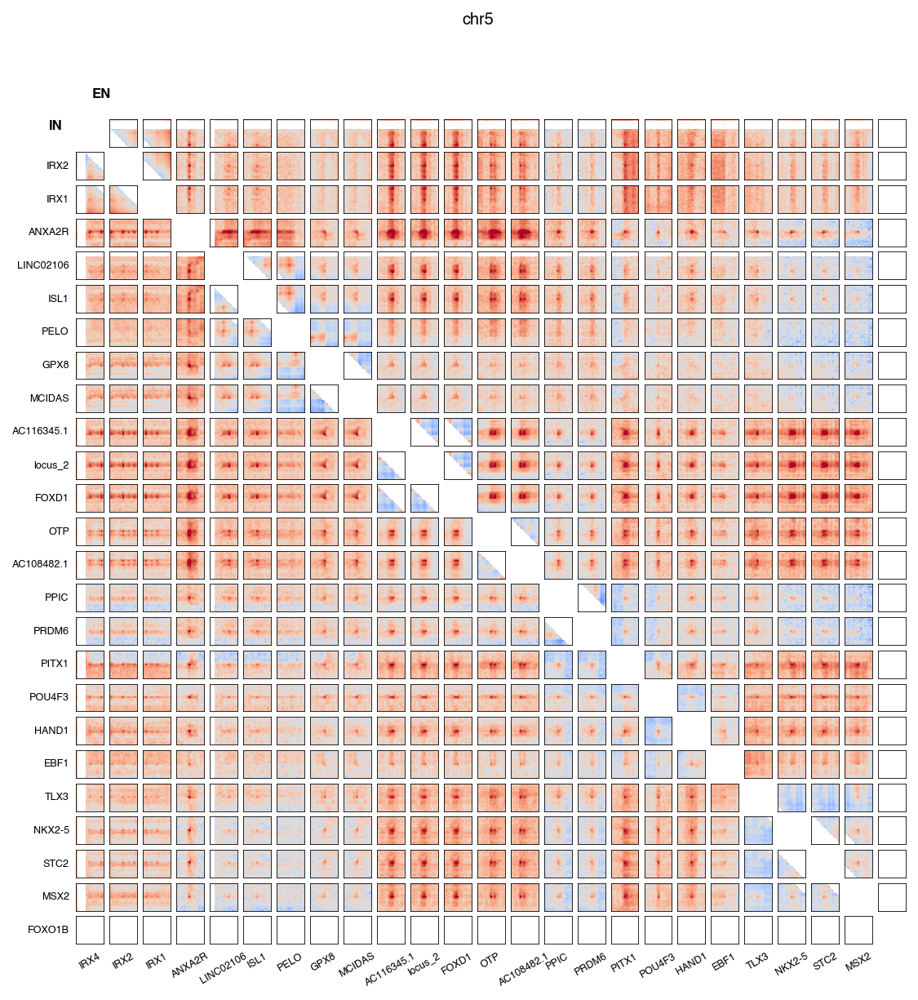

...

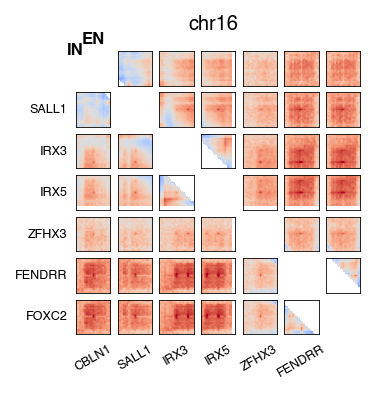

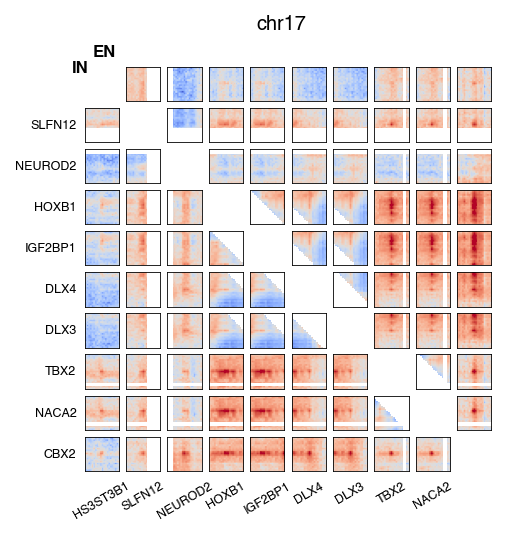

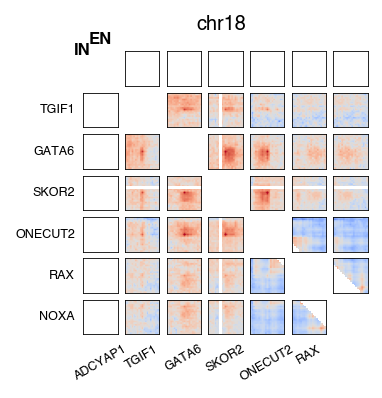

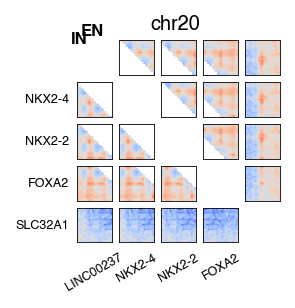

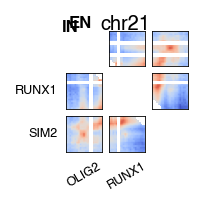

In [38]:
# IN (bottom left) and EN (top right)
for chrom in hand_anch['chrom'].unique():

    chrom_idxs = hand_anch.loc[hand_anch['chrom'] == chrom].index
    vmax=8

    fig, axs = plt.subplots(len(chrom_idxs), len(chrom_idxs), 
                            figsize=(0.35*len(chrom_idxs), 0.35*len(chrom_idxs)), 
                            gridspec_kw = {'wspace': 0.2, 'hspace': 0.2}, dpi=150)

    for i in range(len(chrom_idxs)):
        for j in range(len(chrom_idxs)):
            ax = axs[i, j]
            if i <= j:
                val = np.array(plot_df.loc[chrom_idxs[i], chrom_idxs[j]])
            elif i > j:
                val = np.array(plot_df.loc[chrom_idxs[i], chrom_idxs[j]]).T
            ax.set_xticks([])
            ax.set_yticks([])  
            if val.shape == (2 * (flank // res) + 1, 2 * (flank // res) + 1):
                ax.imshow(
                    val, 
                    cmap='coolwarm',
                    norm=LogNorm(vmax=vmax, vmin=1/vmax)
                )
            else:
                ax.axis('off')
            
            # add gene labels
            genes = hand_anch.loc[chrom_idxs[i], 'genes']
            if (j == 0) and (genes == genes):
                ax.set_ylabel(genes.split(',')[0], rotation=0, ha='right', 
                              va='center', fontsize=6)
                
            genes = hand_anch.loc[chrom_idxs[j], 'genes']   
            if (i == len(chrom_idxs)-1) and (genes == genes):
                ax.set_xlabel(genes.split(',')[0], rotation=30, fontsize=6)
                
    plt.suptitle(chrom)
    fig.text(0.14, 0.9, cts[0], weight='bold')
    fig.text(0.1, 0.87, cts[1], weight='bold')
#     plt.tight_layout()
    # plt.savefig(f'dot_panel/dot_panel.RG-1.RG-2.{chrom}.pdf', bbox_inches='tight')

In [ ]:
pdfs = [f'dot_panel/dot_panel.RG-1.RG-2.{chrom}.pdf' for chrom in hand_anch['chrom'].unique()]

merger = PdfMerger()

for pdf in pdfs:
    merger.append(pdf)

merger.write("dot_panel/dot_panel.RG-1.RG-2.pdf")
merger.close()

In [39]:
# Get type-specific anchors
pair_sites_inv = pair_sites.copy()
pair_sites_inv[['chrom1', 'start1', 'end1', 'genes1', 'idx1',
                       'chrom2', 'start2', 'end2', 'genes2', 'idx2']] = \
pair_sites_inv.loc[:, ['chrom2', 'start2', 'end2', 'genes2', 'idx2',
                       'chrom1', 'start1', 'end1', 'genes1', 'idx1']]
pair_sites_cat = pd.concat([pair_sites, pair_sites_inv], ignore_index=True)\
    .sort_values(['idx1', 'idx2'])
stat_gb = pair_sites_cat\
    .loc[:, ['idx1', 'idx2', 'vals_EN', 'vals_IN']]\
    .groupby('idx1')\
    .agg({'idx2': 'unique', 'vals_EN': list, 'vals_IN': list})\
    .join(hand_anch['genes'].str.split(',').str[0])
stat_gb.head()

,idx2,vals_EN,vals_IN,genes
idx1,,,,
0,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[[[0.9593942451780104, 1.1016202401848567, 1.3...","[[[1.0247722830082788, 1.3365268207242056, 1.2...",PAX7
1,"[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[[[0.9593942451780104, 1.1016202401848567, 1.3...","[[[1.0247722830082788, 1.3365268207242056, 1.2...",RUNX3
2,"[0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[[[1.0254928607332394, 0.7745419252786025, 1.1...","[[[1.3478133112746207, 1.293792284542394, 1.27...",RNF220
3,"[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[[[1.0725378435232211, 1.1866725541270124, 1.4...","[[[0.9130905884119571, 1.1498013730203762, 0.9...",locus_0
4,"[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[[[1.2744313832618748, 1.6842305776265263, 1.6...","[[[0.902989417153697, 1.3508128052851225, 1.82...",TAL1
...,...,...,...,...
257,"[254, 255, 256, 258]","[[[1.3048999273507877, 1.1738236041145624, 0.9...","[[[1.475406457265989, 1.2594140283063202, 1.01...",FOXA2
258,"[254, 255, 256, 257]","[[[0.6678094278551877, 0.6847776625362055, 0.5...","[[[0.3982830807485156, 0.5853934362182253, 0.3...",SLC32A1
259,"[260, 261]","[[[0.2615453086434012, 0.3247561757156988, 0.3...","[[[0.2795915035287772, 0.31468635382562665, 0....",OLIG2


/tmp/ipykernel_1167815/3779458888.py:65: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


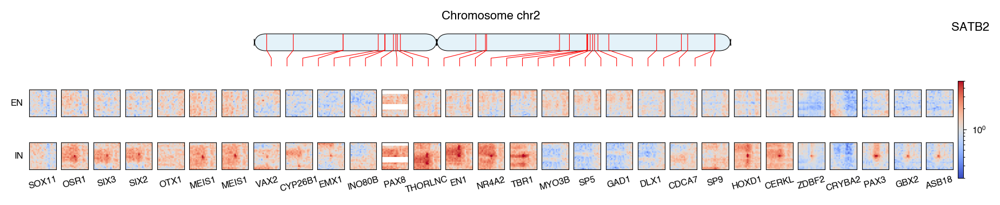

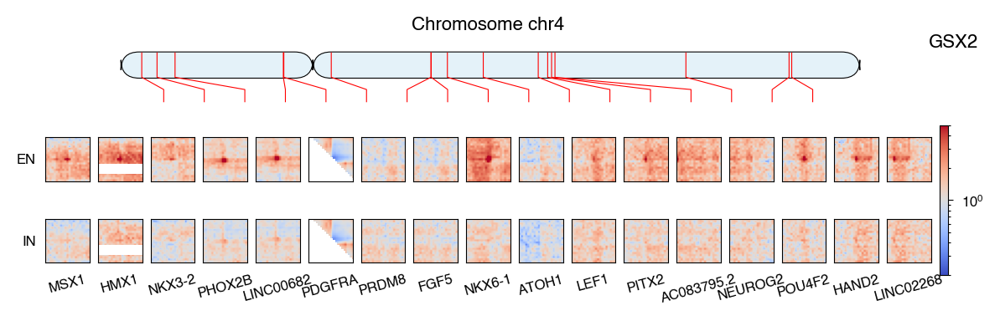

In [41]:
from matplotlib.colors import LogNorm
from chromosome_plotting.chromosome_plotting import Chromosome
import matplotlib.gridspec as gridspec


plot_genes = ['GSX2', 'SATB2']
gene_chroms = {
    'GSX2': 'chr4',
    'SATB2': 'chr2'
}
plot_df = stat_gb.loc[stat_gb['genes'].isin(plot_genes)]

for idx, row in plot_df.iterrows():
    ndots = len(row['vals_EN'])
    target_genes = hand_anch.loc[row['idx2'], 'genes'].str.split(',').str[0].values
    
    wr = [1] * ndots
    wr.append(0.2)
    fig, axs = plt.subplots(3, ndots+1, dpi=200, figsize=[1 + 0.35*ndots, 1.8],
                            gridspec_kw={'width_ratios': wr})
    for ax in axs[:, ndots]:
        ax.remove()
    
    # Plot chromosome
    for ax in axs[0, :ndots]:
        ax.remove()
    gs = axs[0, 0].get_gridspec()
    ax_chr = fig.add_subplot(gs[0, :-1])
    chrom = gene_chroms[row['genes']]
    loci = hand_anch.loc[row['idx2'], 'start'].sort_values()
    chrom_plot = Chromosome(length=hg38_chromsizes[chrom], 
                            name=chrom, 
                            centromere=hg38_cens[chrom],
                            loci=loci)
    chrom_plot.plot_chromosome(ax=ax_chr, height=3, linewidth=0.4)
    ax_chr.text(0.95, 0.95, row['genes'], fontsize=8, transform = ax.transAxes)
    
    # Plot snips
    for i, ct in enumerate(['EN', 'IN'], start=1):
        arr = np.array(row[f'vals_{ct}'])
        
        # if ct == 'EN': # determine maximum value for colorbar
        #     peak = np.max(arr[:, arr.shape[1] // 2, arr.shape[2] // 2]) * 0.45
        
        axs[i, 0].set_ylabel(ct, rotation='horizontal', fontsize=6, ha='right', va='center')
            
        for j in range(ndots):
            ax = axs[i, j]
            pup = ax.imshow(
                arr[j, :, :], 
                cmap='coolwarm',
                norm=LogNorm(vmax=5, vmin=1/5)
            )
            ax.set_aspect(1)
            ax.set_xticks([])
            ax.set_yticks([])
            
            if i == 2:
                ax.set_xlabel(target_genes[j], rotation=15, fontsize=6)
    
    ax_cb = fig.add_subplot(gs[1:, ndots])          
    fig.colorbar(pup, cax=ax_cb, shrink=0.25)
    # plt.savefig(f"dot_snips.EN_IN.{row['genes']}.pdf")

plt.tight_layout()

# Plot dots for subtypes from pseudobulk 

In [8]:
# Select required coolers
res = 100_000
pl_clrs = {
    "L4-IT": clrs[res]["L4-IT"],
    "L5-IT": clrs[res]['L5-IT'],
    "L2-3-IT": clrs[res]['L2-3-IT'],
    "L6-IT": clrs[res]['L6-IT'],
    "L6-IT-Car3": clrs[res]['L6-IT-Car3'],
    "L5-6-NP": clrs[res]['L5-6-NP'],
    "L6b": clrs[res]['L6b'],
    "L6-CT": clrs[res]['L6-CT'],
    # "L5-ET": clrs[res]['L6b'],
    "Pvalb": clrs[res]['Pvalb'],
    "Sst": clrs[res]['Sst'],
    "Lamp5": clrs[res]['Lamp5'],
    "Lamp5-Lhx6": clrs[res]['Lamp5-Lhx6'],
    "Vip": clrs[res]['Vip'],
    "Sncg": clrs[res]['Sncg'],  
}
pl_grps = list(pl_clrs.keys())

In [9]:
# Expected
pl_cvd = {}
nproc = 20
for grp in pl_grps:
    print(grp)
    pl_cvd[grp] = expected_cis_cache(
        pl_clrs[grp],
        view_df=hg38_chromsizes_view,
        smooth=False,
        nproc=nproc
    )

L4-IT
L5-IT
L2-3-IT
L6-IT
L6-IT-Car3
L5-6-NP
L6b
L6-CT
Pvalb
Sst
Lamp5
Lamp5-Lhx6
Vip
Sncg


## Plot for top10 EN-prevalent and IN-prevalent

In [14]:
pca_load = utils.parse_pca_df(pca_loads_path)
pca_load.head(1)

,PC1,PC2,PC3,PC4,genes,gene1,gene2,chrom1,start1,end1,chrom2,start2,end2
"(('chr1', 18630000, 18640000), ('chr1', 24930000, 24940000))",0.046807,-0.019838,0.002143,-0.006629,PAX7 <-> RUNX3,PAX7,RUNX3,chr1,18630000,18640000,chr1,24930000,24940000


In [15]:
pca_top = pd.concat([pca_load.nlargest(10, 'PC2'), 
                     pca_load.nsmallest(10, 'PC2')]).reset_index(drop=True)
pca_top = bf.sort_bedframe(pca_top, cols=['chrom1', 'start1', 'end1'], 
                           reset_index=False)

snips = subt_snips_cache(pca_top, pl_clrs, pl_cvd, hg38_chromsizes_view, nbin_flank=6)

L4-IT
L5-IT
L2-3-IT
L6-IT
L6-IT-Car3
L5-6-NP
L6b
L6-CT
Pvalb
Sst
Lamp5
Lamp5-Lhx6
Vip
Sncg


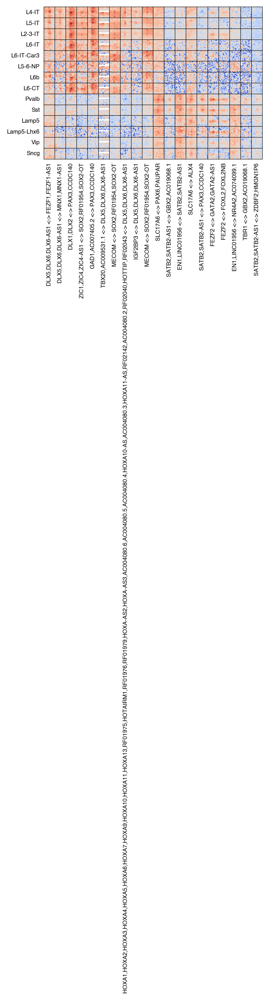

In [16]:
utils.plot_loads(pca_top, pl_grps, snips)